### Laboratorium 3 - zadania

In [1]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from cv2 import adaptiveThreshold
from skimage.segmentation import mark_boundaries, slic

#### Zadanie 1

Dane są obrazy `tabby` i `caries` ([źródło](https://universe.roboflow.com/niu-workespeis/caries-xlrql/dataset/2)). Wykonaj dla nich segmentację przy użyciu algorytmu SLIC. Celem jest uzyskanie **jednolitych**  superpikseli, a więc zawierających tylko fragmenty obiektów lub tylko tła (a nie jednego i drugiego naraz). Przeanalizuj zachowanie algorytmu dla różnej liczby superpikseli i parametru sigma.

Zwróć uwagę, że wynikiem działania scikitowej implementacji SLIC - [`skimage.segmentation.slic`](https://scikit-image.org/docs/stable/api/skimage.segmentation.html#skimage.segmentation.slic) - (podobnie jak wielu innych algorytmów klasyfikacyjnych) jest obraz typu `np.int64` przyporządkowujący każdemu pikselowi obrazu wejściowego indeks superpiksela. Takiej reprezentacji oczekuje też funkcja [`mark_boundaries`](https://scikit-image.org/docs/stable/api/skimage.segmentation.html#skimage.segmentation.mark_boundaries).

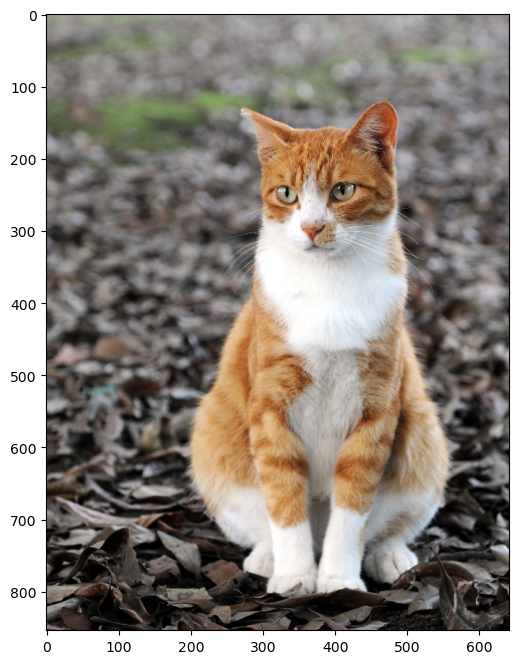

In [3]:
_ = cv2.imread('../data/tabby.jpg')[..., ::-1]
tabby = cv2.resize(_, dsize=None, fx=0.3, fy=0.3)
plt.subplots(1,1,figsize=(8,8))[1].imshow(tabby);

In [5]:
def get_segmented(img, slic_parameters):
    segments = slic(img, **slic_parameters)
    segmented_img = mark_boundaries(img, segments)
    return segmented_img

In [18]:
def plot_segmentation_experiments(img, sigmas, ns_segments, slic_parameters=None):
    if slic_parameters is None:
        slic_parameters = dict()
    _, axes = plt.subplots(len(sigmas), len(ns_segments), figsize=(24, 24))

    for i, sigma in enumerate(sigmas):
        for j, n_segments in enumerate(ns_segments):
            experiment = {**slic_parameters, 'n_segments': n_segments, 'sigma': sigma}
            segmented = get_segmented(img, experiment)
            axes[i, j].imshow(segmented)
            axes[i, j].axis('off')
            axes[i, j].set_title(f'n_segments = {n_segments}, sigma = {sigma}')

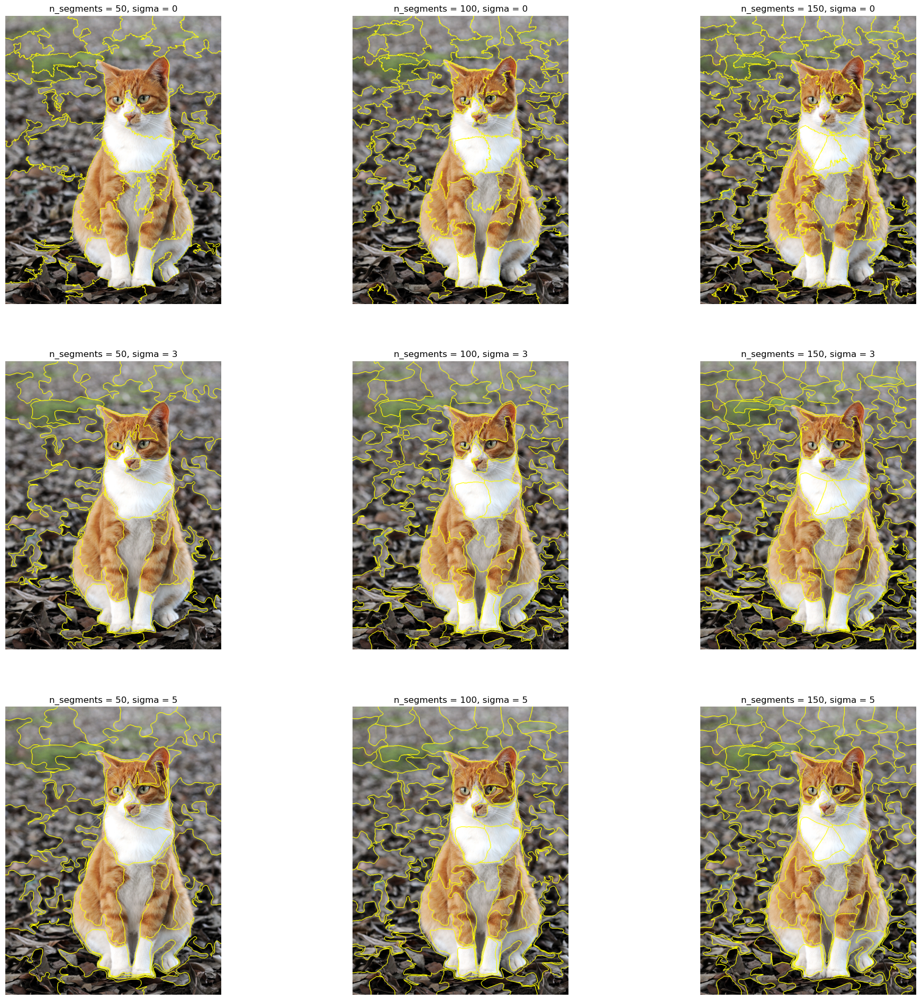

In [254]:
sigmas_tabby = [0, 3, 5]
ns_segments_tabby = [50, 100, 150]
plot_segmentation_experiments(tabby, sigmas_tabby, ns_segments_tabby)

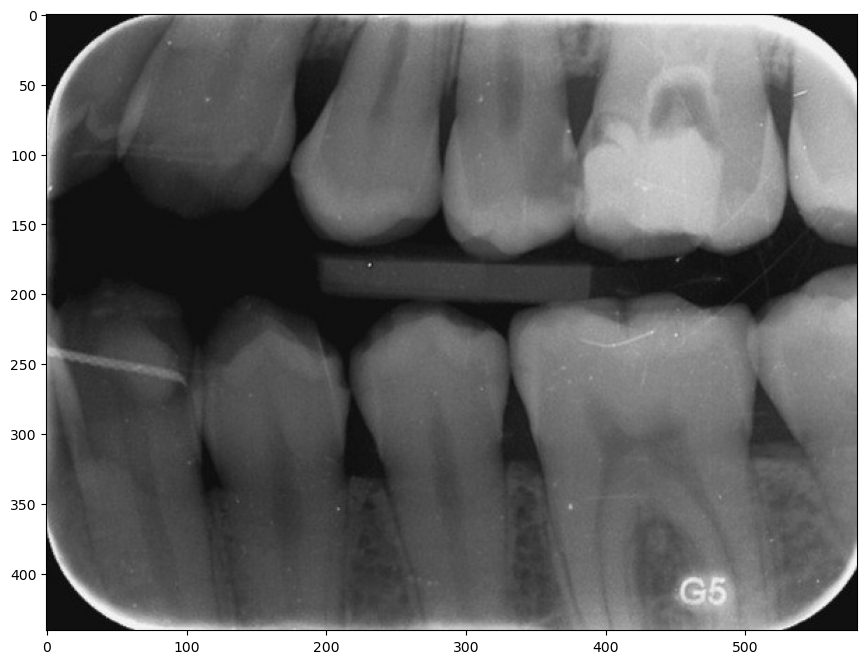

In [23]:
pills = cv2.imread('../data/roboflow-caries-117.jpg')[..., 0]
plt.subplots(1,1,figsize=(12,8))[1].imshow(pills, cmap='gray');

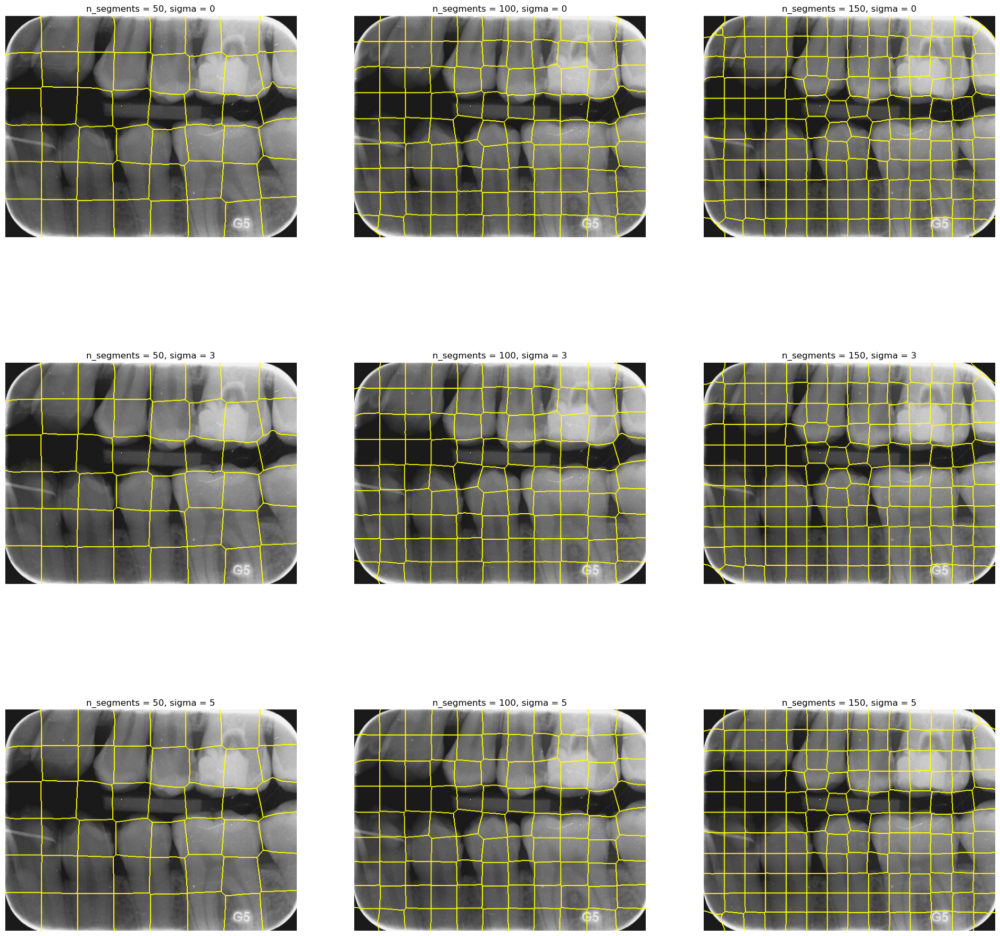

In [24]:
sigmas_caries = [0, 3, 5]
ns_segments_caries = [50, 100, 150]
plot_segmentation_experiments(pills, sigmas_caries, ns_segments_caries, {'compactness': 1, 'channel_axis': None})

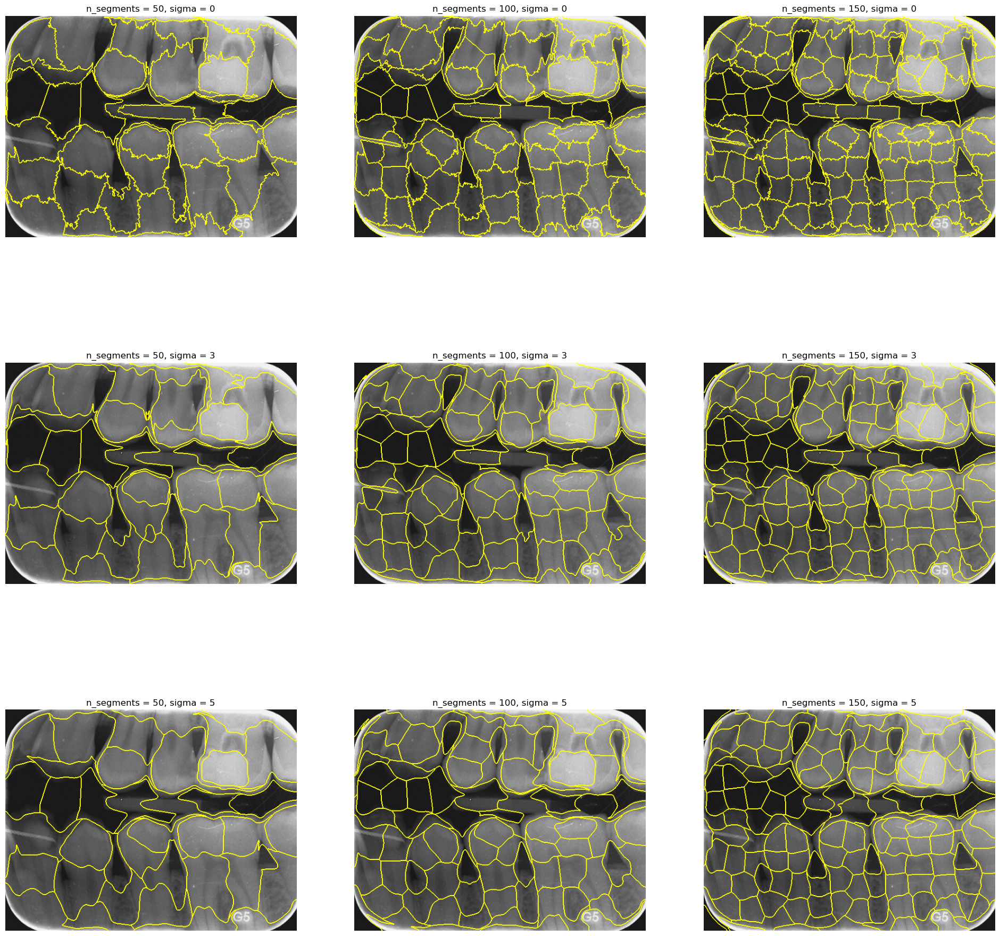

In [25]:
sigmas_caries = [0, 3, 5]
ns_segments_caries = [50, 100, 150]
plot_segmentation_experiments(pills, sigmas_caries, ns_segments_caries, {'compactness': 0.1, 'channel_axis': None})

#### Zadanie 2

Wykonaj segmentację wododziałową dla obrazów `tabby` i `caries` za pomocą funkcji [`cv2.watershed`](https://docs.opencv.org/4.x/d3/d47/group__imgproc__segmentation.html#ga3267243e4d3f95165d55a618c65ac6e1). Implementacja OpenCV przyjmuje dwa argumenty: obraz wejściowy (8-bit, 3 kanały) i obraz wyjściowy (32-bit, 1 kanał).

Uwaga: obraz wyjściowy musi zawierać oznaczenia początkowe segmentów (_markery_) - to znaczy, że musisz zacząć od przygotowania macierzy markerów. Poprawnie przygotowana macierz zawiera $N$ markerów, tj. pikseli oznaczonych liczbami całkowitymi od 1 do $N$, a wartość pozostałych pikseli wynosi 0. Piksele zerowe zostaną przyporządkowane do grup dookoła markerów.

Sugerowane metody przygotowania markerów (wybierz dwie i porównaj):
* równomierna siatka
* lokalne minima jasności
* manualnie wybrane centra (_segmentacja interaktywna_)

### regular grid

In [51]:
def get_regular_grid(width, height, n=100):
    a = max(1, int(round(np.sqrt(n * width / height))))
    b = max(1, int(np.ceil(n / a)))

    rows = np.round(np.linspace(0, width-1, a)).astype(int)
    cols = np.round(np.linspace(0, height-1, b)).astype(int)

    rr, cc = np.meshgrid(rows, cols, indexing='ij')
    pts = np.column_stack([rr.ravel(), cc.ravel()])

    return pts[:n]

In [86]:
def plot_watershed(img, ns, kernels):
    _, axes = plt.subplots(len(kernels), len(ns), figsize=(24, 24))
    if img.ndim == 2:
        img_shape = img.shape
    elif img.ndim == 3:
        img_shape = img[..., 0].shape
    else:
        return
    for i, kernel in enumerate(kernels):
        for j, n in enumerate(ns):
            blurred = cv2.GaussianBlur(img, (kernel, kernel), 0)
            initial_centers = get_regular_grid(*img_shape, n=n)
            markers = np.zeros(img_shape, dtype=np.int32)
            markers[initial_centers[:, 0], initial_centers[:, 1]] = range(n)
            boundaries = cv2.watershed(blurred, markers)
            axes[i, j].imshow(mark_boundaries(img, boundaries))
            axes[i, j].axis('off')
            axes[i, j].set_title(f'kernel ={kernel}, n_segments = {n}')

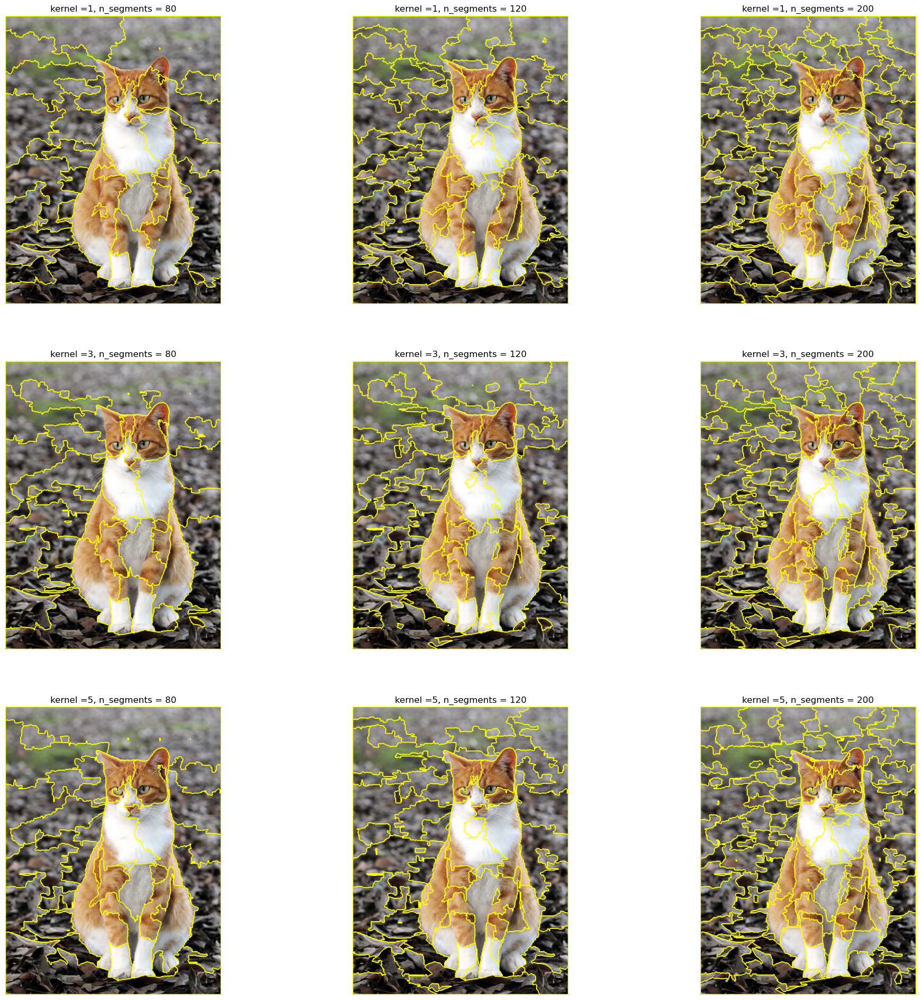

In [89]:
plot_watershed(tabby, [80, 120, 200], [1, 3, 5])

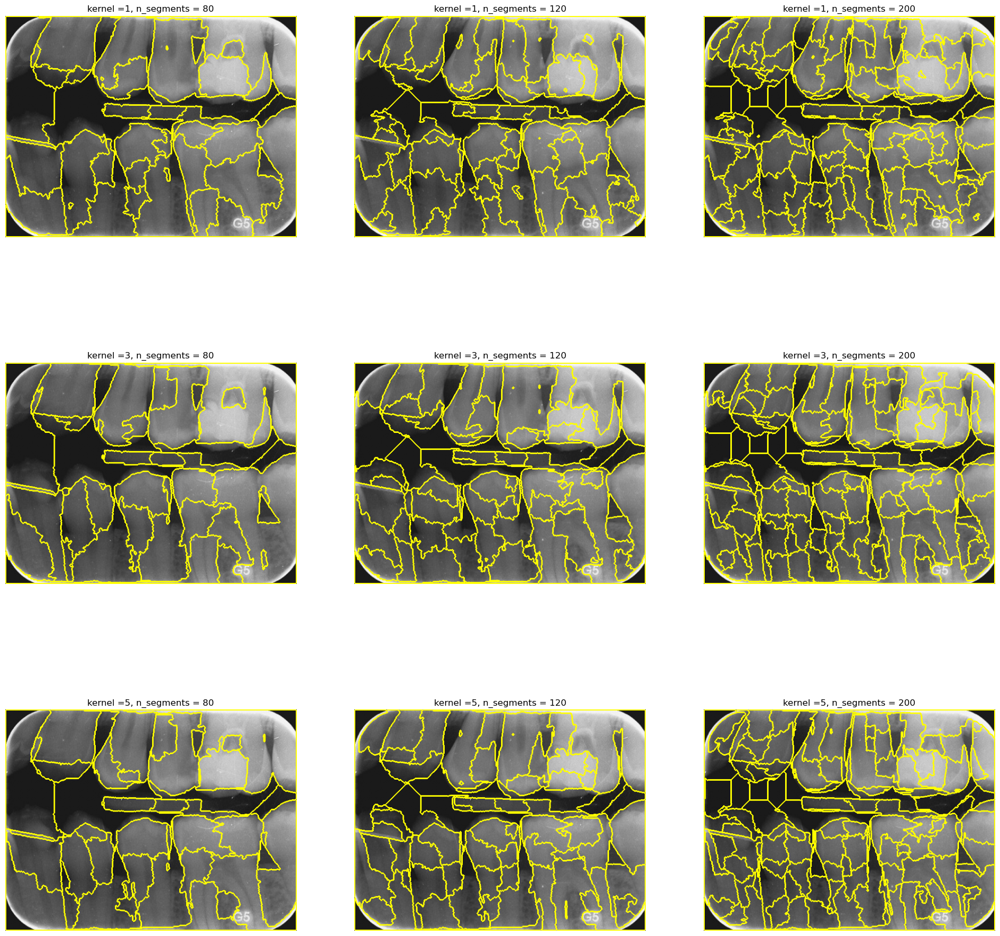

In [90]:
plot_watershed(cv2.cvtColor(pills, cv2.COLOR_GRAY2BGR), [80, 120, 200], [1, 3, 5])

### lokalne minima jasności

In [309]:
from copy import deepcopy

from skimage.measure import label
from skimage.morphology import h_minima

In [313]:
def plot_watershed_local_minima(img, kernels, hs, threshold=None):
    _, axes = plt.subplots(len(kernels), len(hs), figsize=(24, 24))
    for i, kernel in enumerate(kernels):
        for j, h in enumerate(hs):
            if img.ndim == 3:
                gray_img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
            else:
                gray_img = deepcopy(img)
            gray_img = cv2.equalizeHist(gray_img)
            gray_img = cv2.bilateralFilter(gray_img, 9, 75, 75).astype(np.uint8)
            if threshold:
                _, gray_img = cv2.threshold(gray_img, threshold, 255, cv2.THRESH_TOZERO)
            minima = h_minima(gray_img, h)
            labeled_minima = np.ascontiguousarray(label(minima), dtype=np.int32)
            if img.ndim == 2:
                img = cv2.cvtColor(img, cv2.COLOR_GRAY2BGR)
            boundaries = cv2.watershed(cv2.bilateralFilter(img, 9, 75, 75).astype(np.uint8), labeled_minima)
            axes[i, j].imshow(mark_boundaries(img, boundaries))
            axes[i, j].axis('off')
            axes[i, j].set_title(f'kernel ={kernel}, h={h}')

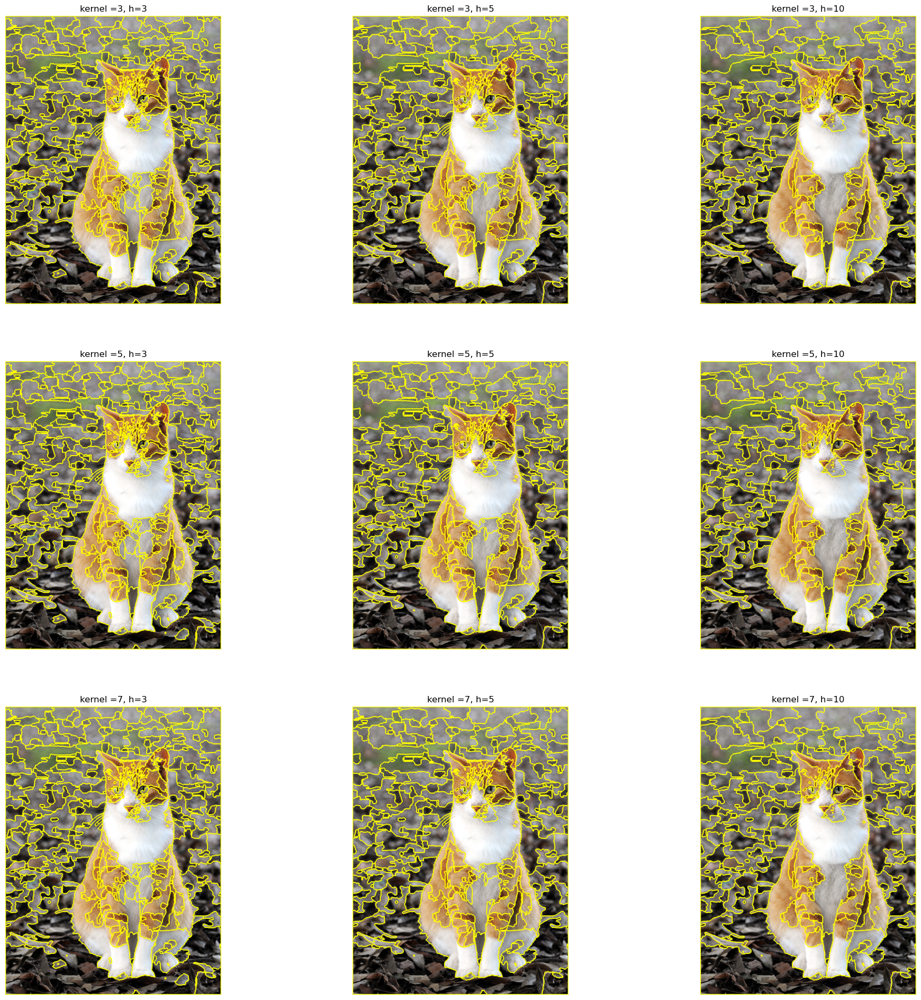

In [314]:
plot_watershed_local_minima(tabby, [3, 5, 7], [3, 5, 10], threshold=50)

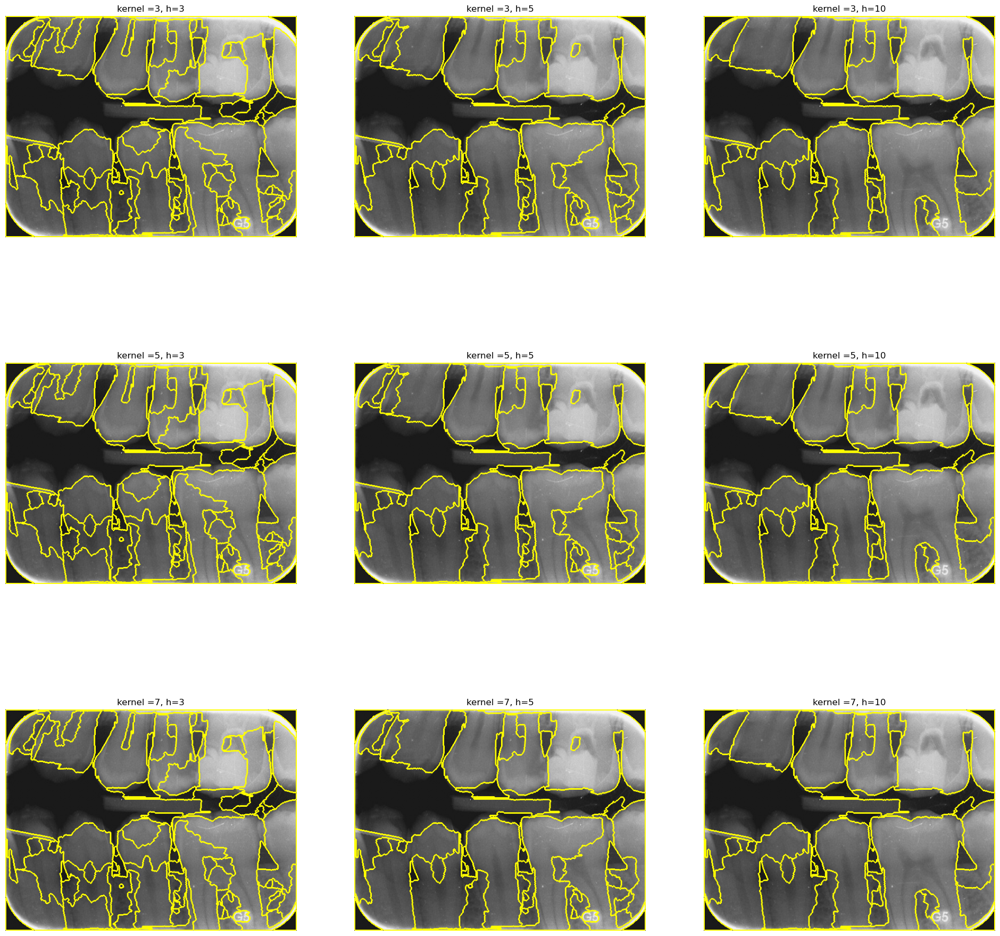

In [322]:
plot_watershed_local_minima(pills, [3, 5, 7], [3, 5, 10], threshold=20)

p---

#### Zadanie dodatkowe (dla chętnych, bez oceny)

Dla obrazu `tabby` wykonaj post-processing wybranej metody segmentacji by uzyskać dwa jednorodne obszary: jeden zawierający wyłącznie kota, drugi zawierający wyłącznie tło.

Można to zadanie potraktować jako binaryzację na poziomie superpikseli i zrealizować je za pomocą progowania. 
Można też potraktować je jako klasteryzację superpikseli i wykorzystać np. [`cv2.kmeans`](https://docs.opencv.org/4.x/d5/d38/group__core__cluster.html#ga9a34dc06c6ec9460e90860f15bcd2f88).  
Niezależnie od wybranej ścieżki, konieczne będzie:
1. dobranie odpowiednich (czyli jakich?) parametrów algorytmu segmentacji,
2. opisanie każdego z superpikseli za pomocą jakiejś *cechy/cech* (jakich?), opisującej semantykę rejonów, tak aby na tej podstawie dokonać klasyfikacji.

In [ ]:
# zacznij od przygotowania macierzy wejściowej (data) reprezentującej superpiksele jako punkty danych

In [287]:
pills.shape

(441, 580)